e:\Conda\envs\cv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
  2%|▏         | 9/500 [00:07<06:28,  1.26it/s]

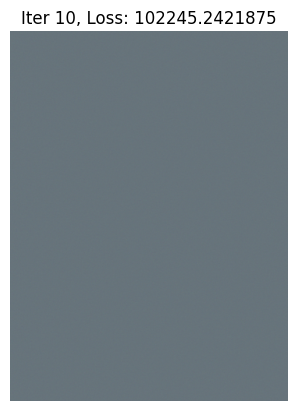

  4%|▍         | 19/500 [00:15<06:23,  1.26it/s]

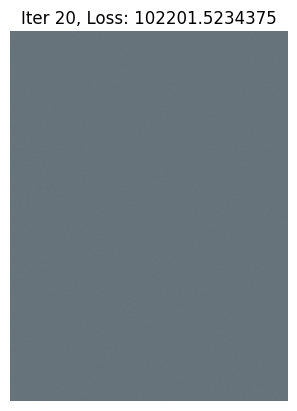

  6%|▌         | 29/500 [00:23<06:07,  1.28it/s]

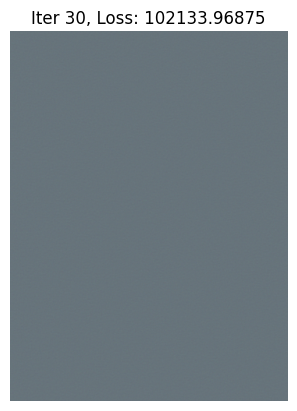

  8%|▊         | 39/500 [00:31<06:06,  1.26it/s]

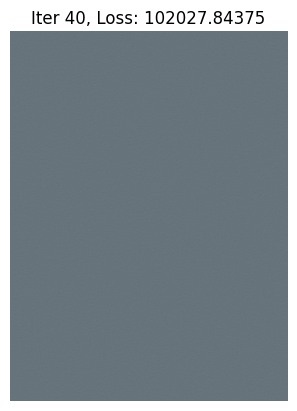

 10%|▉         | 49/500 [00:39<05:51,  1.28it/s]

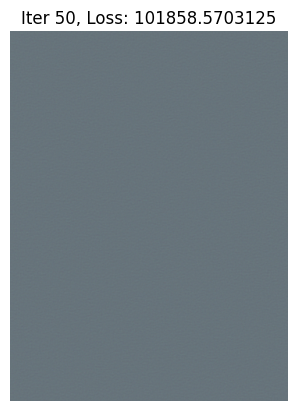

 12%|█▏        | 59/500 [00:47<05:48,  1.26it/s]

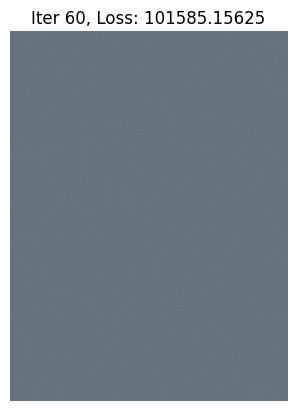

 14%|█▍        | 69/500 [00:55<05:38,  1.27it/s]

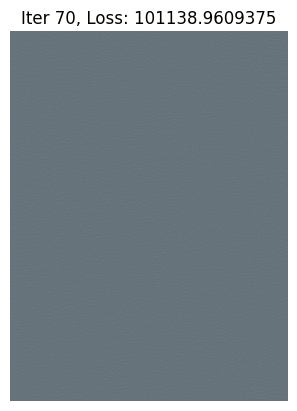

 16%|█▌        | 79/500 [01:03<05:24,  1.30it/s]

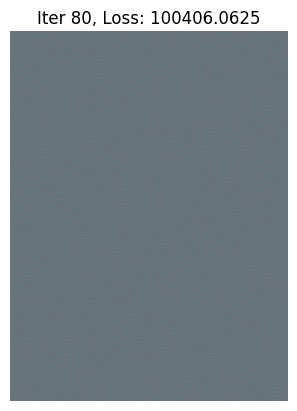

 18%|█▊        | 89/500 [01:11<05:17,  1.29it/s]

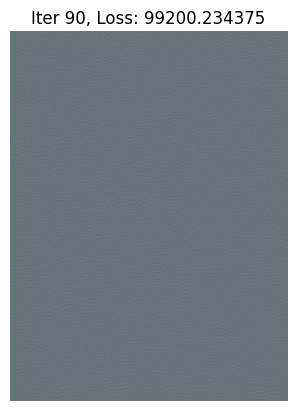

 20%|█▉        | 99/500 [01:19<05:10,  1.29it/s]

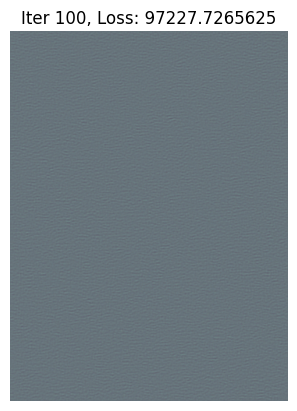

 22%|██▏       | 109/500 [01:27<05:03,  1.29it/s]

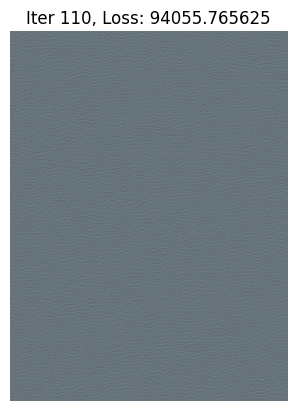

 24%|██▍       | 119/500 [01:35<04:54,  1.29it/s]

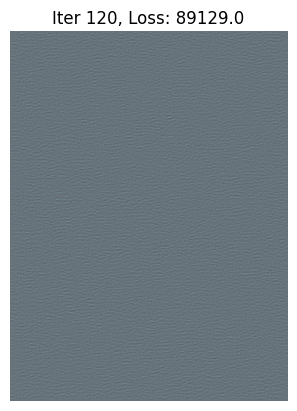

 26%|██▌       | 129/500 [01:43<04:47,  1.29it/s]

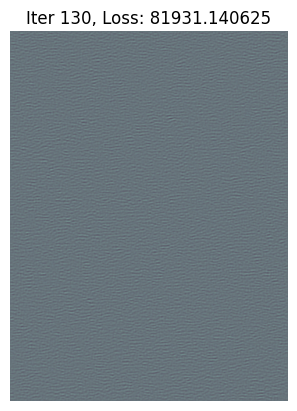

 28%|██▊       | 139/500 [01:51<04:39,  1.29it/s]

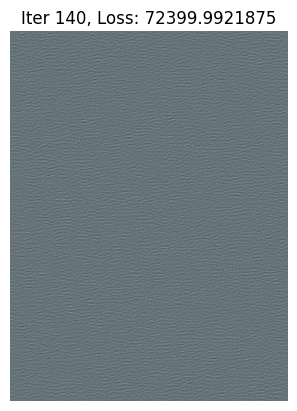

 30%|██▉       | 149/500 [01:58<04:35,  1.27it/s]

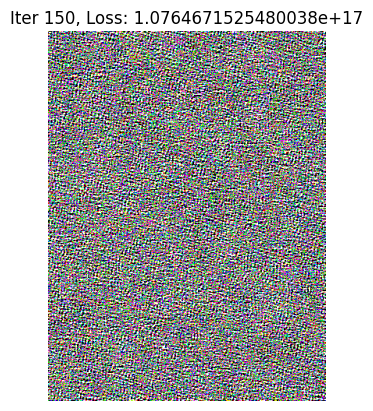

 32%|███▏      | 159/500 [02:09<06:02,  1.06s/it]

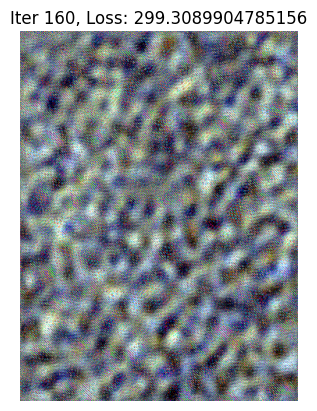

 34%|███▍      | 169/500 [02:20<05:53,  1.07s/it]

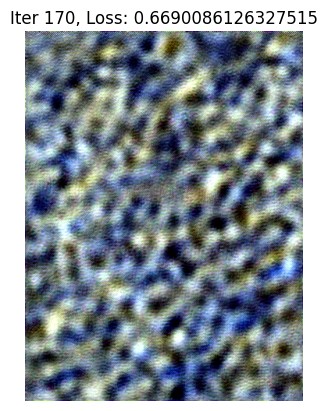

 36%|███▌      | 179/500 [02:30<05:42,  1.07s/it]

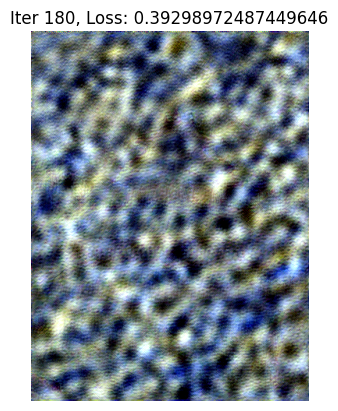

 38%|███▊      | 189/500 [02:42<05:44,  1.11s/it]

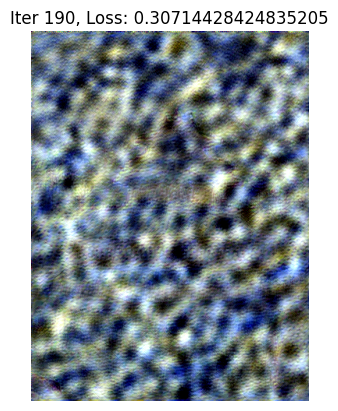

 40%|███▉      | 199/500 [02:53<05:30,  1.10s/it]

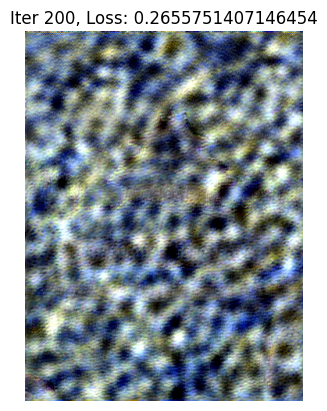

 42%|████▏     | 209/500 [03:04<05:23,  1.11s/it]

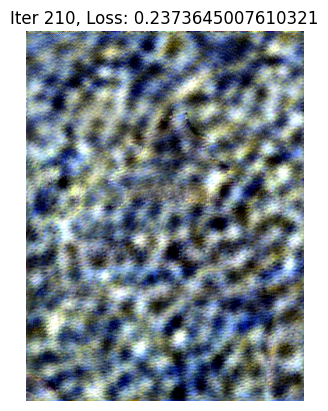

 44%|████▍     | 219/500 [03:15<05:05,  1.09s/it]

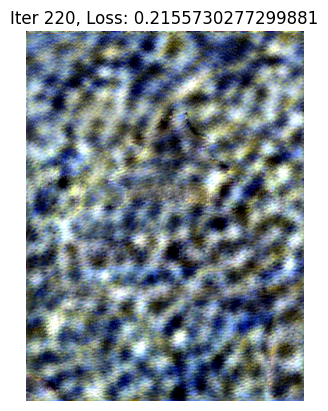

 46%|████▌     | 229/500 [03:26<05:03,  1.12s/it]

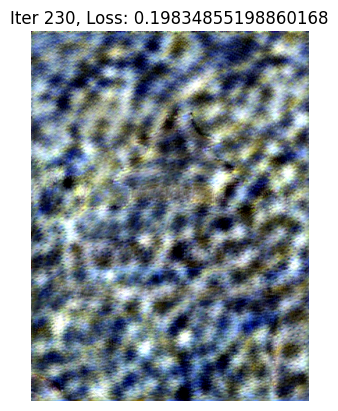

 48%|████▊     | 239/500 [03:38<04:56,  1.13s/it]

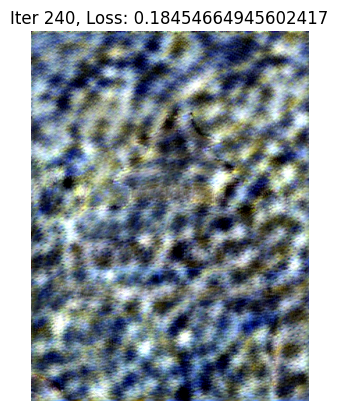

 50%|████▉     | 249/500 [03:49<04:46,  1.14s/it]

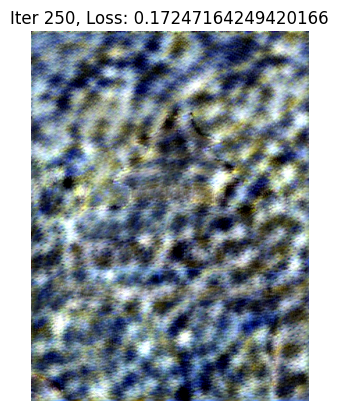

 52%|█████▏    | 259/500 [04:01<04:33,  1.14s/it]

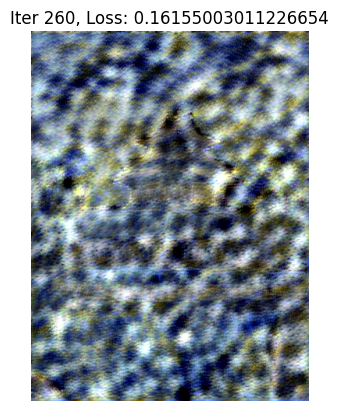

 54%|█████▍    | 269/500 [04:12<04:16,  1.11s/it]

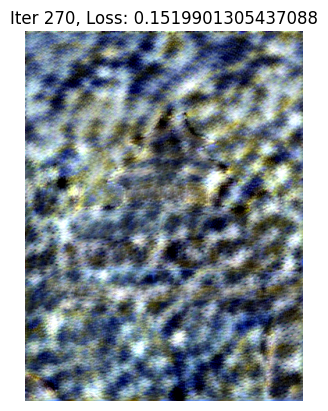

 56%|█████▌    | 279/500 [04:23<04:15,  1.16s/it]

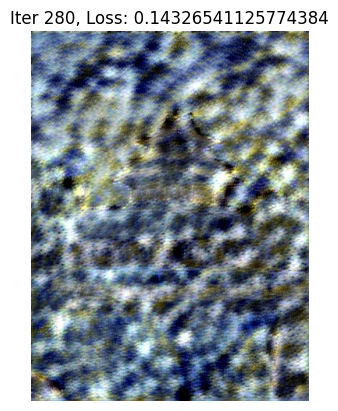

 58%|█████▊    | 289/500 [04:35<04:00,  1.14s/it]

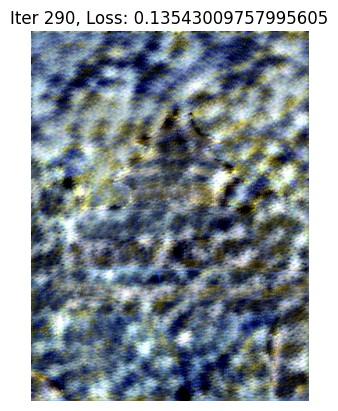

 60%|█████▉    | 299/500 [04:46<03:44,  1.12s/it]

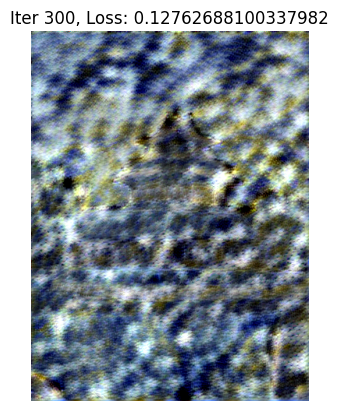

 62%|██████▏   | 309/500 [04:58<03:38,  1.14s/it]

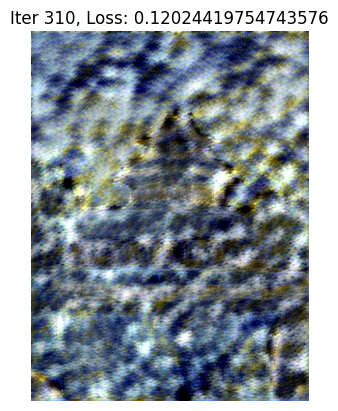

 64%|██████▍   | 319/500 [05:09<03:19,  1.10s/it]

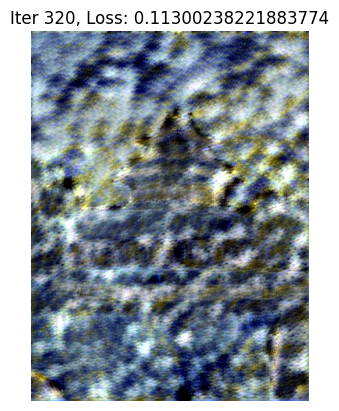

 66%|██████▌   | 329/500 [05:20<03:10,  1.11s/it]

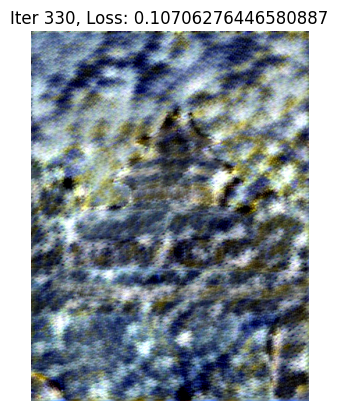

 68%|██████▊   | 339/500 [05:32<03:01,  1.13s/it]

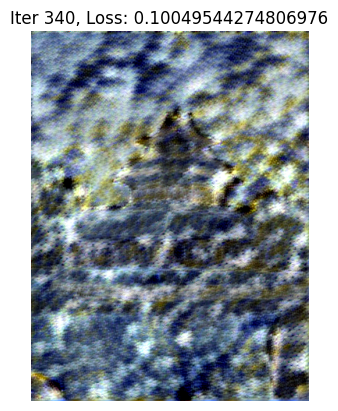

 70%|██████▉   | 349/500 [05:43<02:49,  1.12s/it]

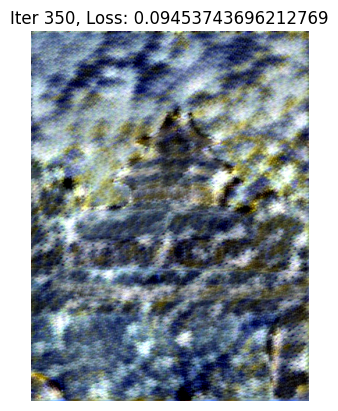

 72%|███████▏  | 359/500 [05:54<02:37,  1.11s/it]

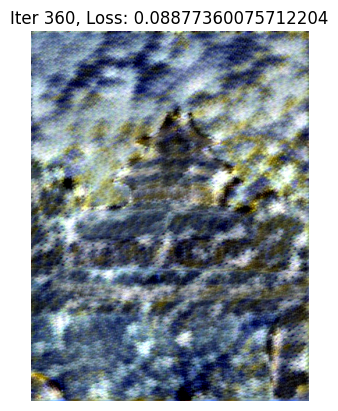

 74%|███████▍  | 369/500 [06:05<02:22,  1.08s/it]

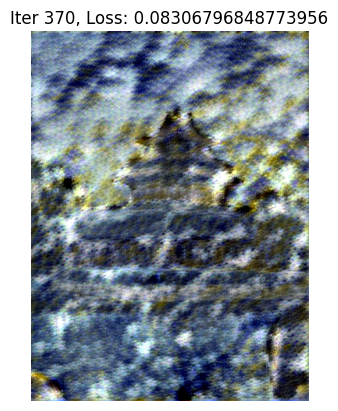

 76%|███████▌  | 379/500 [06:16<02:12,  1.10s/it]

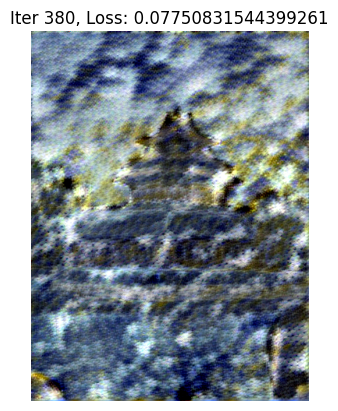

 78%|███████▊  | 389/500 [06:28<02:06,  1.14s/it]

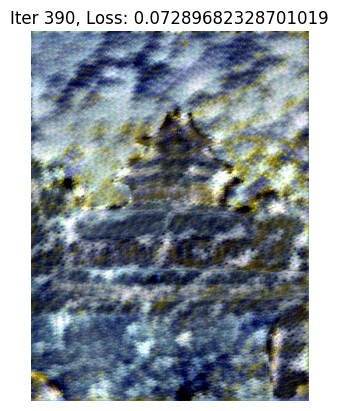

 80%|███████▉  | 399/500 [06:39<01:50,  1.09s/it]

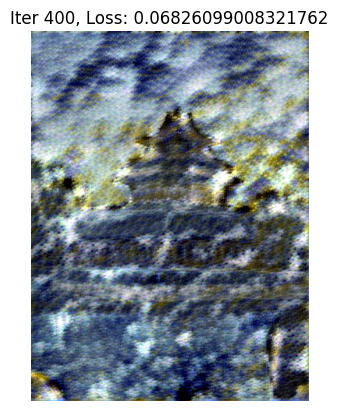

 82%|████████▏ | 409/500 [06:50<01:39,  1.10s/it]

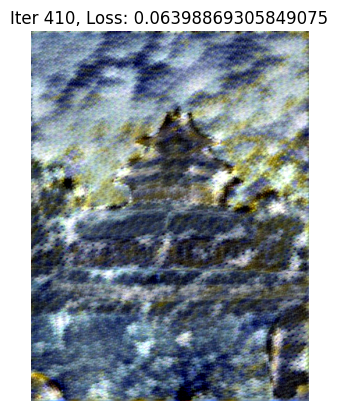

 84%|████████▍ | 419/500 [07:01<01:29,  1.10s/it]

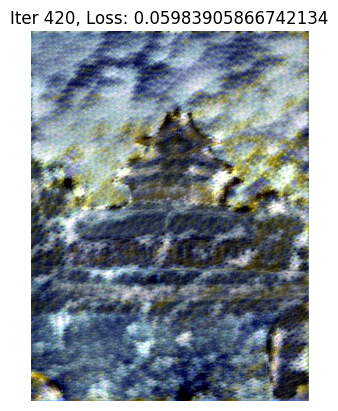

 86%|████████▌ | 429/500 [07:12<01:16,  1.08s/it]

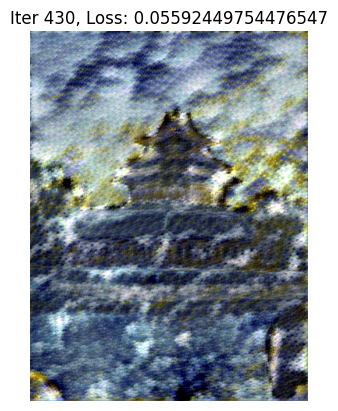

 88%|████████▊ | 439/500 [07:23<01:07,  1.10s/it]

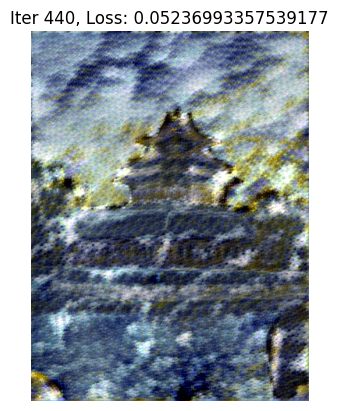

 90%|████████▉ | 449/500 [07:34<00:54,  1.08s/it]

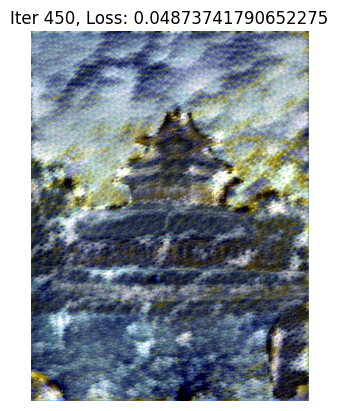

 92%|█████████▏| 459/500 [07:45<00:43,  1.07s/it]

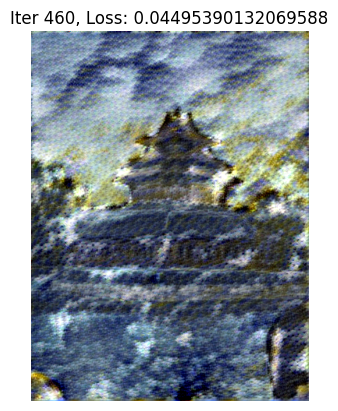

 94%|█████████▍| 469/500 [07:55<00:32,  1.05s/it]

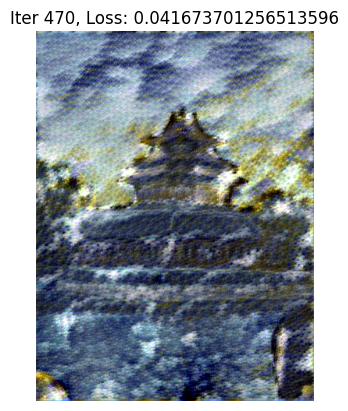

 96%|█████████▌| 479/500 [08:06<00:22,  1.06s/it]

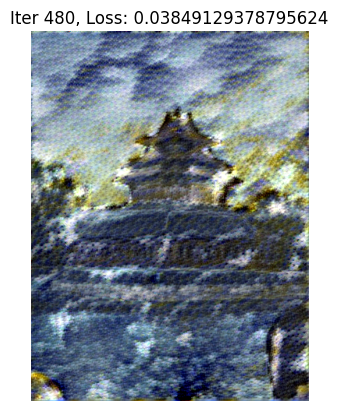

 98%|█████████▊| 489/500 [08:17<00:11,  1.07s/it]

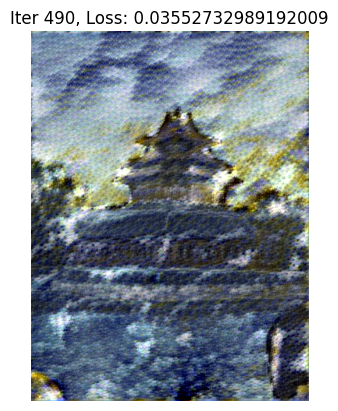

100%|█████████▉| 499/500 [08:28<00:01,  1.10s/it]

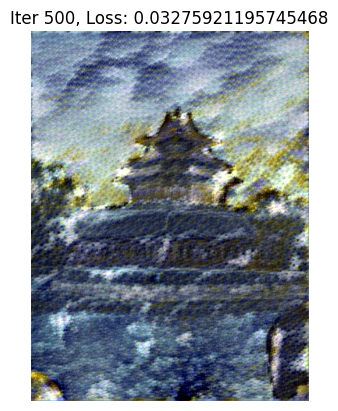

100%|██████████| 500/500 [08:29<00:00,  1.02s/it]


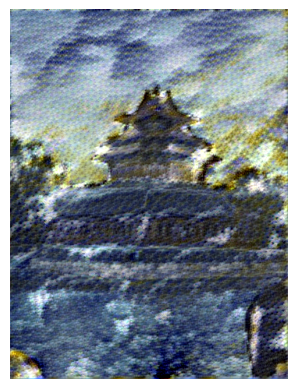

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import models
from torchvision import transforms
from torchvision.models import VGG19_BN_Weights
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import argparse


class VGGNet(nn.Module):
    def __init__(self):
        super().__init__()
        # content on conv4_2
        # style on conv1_1, conv2_1, conv3_1, conv4_1, conv5_1
        self.select = ['0', '7', '14', '27', '40', '30']
        vgg = models.vgg19_bn(weights=VGG19_BN_Weights).features  # pretrained VGG19 model
        for param in vgg.parameters():
            param.requires_grad_(False)
        self.vgg = nn.Sequential(*[self.replace_layers(layer) for layer in vgg[:29]])
    
    def replace_layers(self, layer):
        if isinstance(layer, nn.MaxPool2d):
            return nn.AvgPool2d(kernel_size=layer.kernel_size, stride=layer.stride, padding=layer.padding)
        elif isinstance(layer, nn.BatchNorm2d):
            norm = nn.InstanceNorm2d(layer.num_features, affine=True)
            norm.requires_grad_(False)
            return norm
        return layer

    def forward(self, x):
        features = []
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.select:
                features.append(x)
        return features


def preprocess(
        image_path,
        transform=None,
        device=None
):
    """
    read an image
    process it to tensor available for vgg
    """
    image = Image.open(image_path)
    if transform:
        image = transform(image).unsqueeze(0)
    return image.to(device, torch.float)


def get_features(image, model):
    """
    get feature vectors
    """
    layers = model(image)
    features = []
    for layer in layers:
        feature = layer.reshape(layer.shape[1], -1)
        features.append(feature)
    return features


def gram_matrix(tensor):
    c , hw = tensor.size()
    gram = torch.mm(tensor, tensor.t())
    return gram / hw


if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    image_size = 356
    img_path = './img/'
    save_path = './results/'
    content_path = f'{img_path}content1.jpg'
    style_path = f'{img_path}style1.jpg'

    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x[torch.LongTensor([2, 1, 0])]),
        transforms.Normalize(
            (0.485, 0.456, 0.406),
            (1, 1, 1)
        ),
        transforms.Lambda(lambda x: x.mul_(255))
    ])

    postprocess = transforms.Compose([
        transforms.Lambda(lambda x: x.mul_(1./255)),
        transforms.Normalize(
            mean=[-0.485, -0.456, -0.406],
            std=[1, 1, 1]
        ),
        transforms.Lambda(lambda x: x[torch.LongTensor([2, 1, 0])]),
        transforms.Lambda(lambda x: torch.clamp(x, 0, 1)),
        transforms.ToPILImage()
    ])

    # load content and style image
    content = preprocess(
        content_path,
        transform=transform,
        device=device
    )
    style = preprocess(
        style_path,
        transform=transform,
        device=device
    )

    model = VGGNet().to(device).eval()

    # get content and style features
    content_features = get_features(content, model)[-1]
    style_features = get_features(style, model)[:-1]
    style_grams = [gram_matrix(feature) for feature in style_features]

    # white noise image
    target = torch.randn_like(content).requires_grad_(True).to(device)
    # target = content.clone().requires_grad_(True).to(device)

    content_weight = 1
    style_weights = [1e3 / n ** 2 for n in [64, 128, 256, 512, 512]]
    optimizer = optim.LBFGS([target], lr=0.5)
    steps = 500
    show_every = 10

    def closure():
        optimizer.zero_grad()
        target_features = get_features(target, model)
        content_loss = F.mse_loss(target_features[-1], content_features) * content_weight
        style_loss = 0
        for target_style, style_gram, style_weight in zip(
                target_features[:-1],
                style_grams,
                style_weights
        ):
            target_gram = gram_matrix(target_style)
            style_loss += F.mse_loss(target_gram, style_gram) * style_weight
        total_loss = content_loss + style_loss
        total_loss.backward()
        return total_loss

    for i in tqdm(range(1, steps + 1)):
        optimizer.step(closure)
        if i % show_every == 0:
            loss = closure()
            plt.imshow(postprocess(target[0].cpu().detach()))
            plt.axis("off")
            plt.title(f"Iter {i}, Loss: {loss.item()}")
            plt.show()

    # save image
    plt.imshow(postprocess(target[0].cpu().detach()))
    plt.axis("off")
    content_name = content_path.split('/')[-1].split('.')[0]
    style_name = style_path.split('/')[-1].split('.')[0]
    plt.savefig(f'{save_path}{content_name}_{style_name}_norm.png')
    plt.show()
